# **CH1701018 - CAO THỊ THƯƠNG**
#   **Face Recognition Mini-Challenge**



*   Sử dụng thư viện face_recognition để nhận dạng face: https://face-recognition.readthedocs.io/en/latest/installation.html
*   Reference: https://hackernoon.com/face-recognition-using-opencv-a-step-by-step-guide-to-build-a-facial-recognition-system-8da97cd89847



Thư viện face_recognition hỗ trợ nhận dạng khuôn mặt và các bộ phận trên khuôn mặt với độ chính xác 99.38% trên Labeled Faces trong tiêu chuẩn Wild.

Các tính năng của thư viện là: Tìm các face xuất hiện trong bức tranh, tìm các bộ phận trên khuôn mặt, xác định các face trong bức tranh.

Để sử dụng thư viện face_recognition chúng ta phải runtime với GPU

In [0]:
!pip install face_recognition

     |████████████████████████████████| 100.2MB 50.6MB/s 
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


In [0]:
import face_recognition
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

Get image set from Google Drive to google colab

In [0]:
# Run this cell to mount your Google Drive.
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


#Train data

Read image from FaceDB on Google Driver and load data to model



In [0]:
known_face_encodings=[]
know_face_names=[]
path="/content/drive/My Drive/FaceDB"

print("Load images to create train data")
for root,dirs,files in os.walk(path):
  for folder in dirs:
        for filename in os.listdir(os.path.join(root, folder)):
          print(os.path.join(root, folder,filename))
          
          #load image and learn how to recognize them.
          image_loaded = face_recognition.load_image_file(os.path.join(root, folder,filename))
          # "face_recognition.face_encodings": it's a face_recognition package 
          # which returns a list of 128-dimensional face encodings
          face_encodings = face_recognition.face_encodings(image_loaded)
                
          # loop over the encodings
          for encoding in face_encodings:
          # add each encoding to our set of known names and encodings
            known_face_encodings.append(encoding)
            know_face_names.append(folder)
          
print("training finished")


Load images to create train data
/content/drive/My Drive/FaceDB/TAIHPT/face_19.jpg
/content/drive/My Drive/FaceDB/TRUONGTX/IMG_5328_face002.jpg
/content/drive/My Drive/FaceDB/VULQ/vulq01.jpg
/content/drive/My Drive/FaceDB/VULQ/vulq03.jpg
/content/drive/My Drive/FaceDB/VULQ/vulq02.jpg
/content/drive/My Drive/FaceDB/VULQ/vulq04.jpg
/content/drive/My Drive/FaceDB/PHUONGTD/face1.png
/content/drive/My Drive/FaceDB/PHUONGTD/face3.jpg
/content/drive/My Drive/FaceDB/HANTQ/HANTQ.jpg
/content/drive/My Drive/FaceDB/QUANVM/0.png
/content/drive/My Drive/FaceDB/QUANVM/1.png
/content/drive/My Drive/FaceDB/QUANVM/2.png
/content/drive/My Drive/FaceDB/DUYETLV/face-43.jpg
/content/drive/My Drive/FaceDB/DUYETLV/face-5.jpg
/content/drive/My Drive/FaceDB/DUYETLV/Screen Shot 2019-02-27 at 6.39.22 PM.png
/content/drive/My Drive/FaceDB/DUYETLV/Screen Shot 2019-02-27 at 6.38.53 PM.png
/content/drive/My Drive/FaceDB/DUYETLV/Screen Shot 2019-02-27 at 6.39.12 PM.png
/content/drive/My Drive/FaceDB/VUND/vund2.png
/c

#Detect Face
 

/content/drive/My Drive/TESTDATA_FACE/IMG_5332.jpg


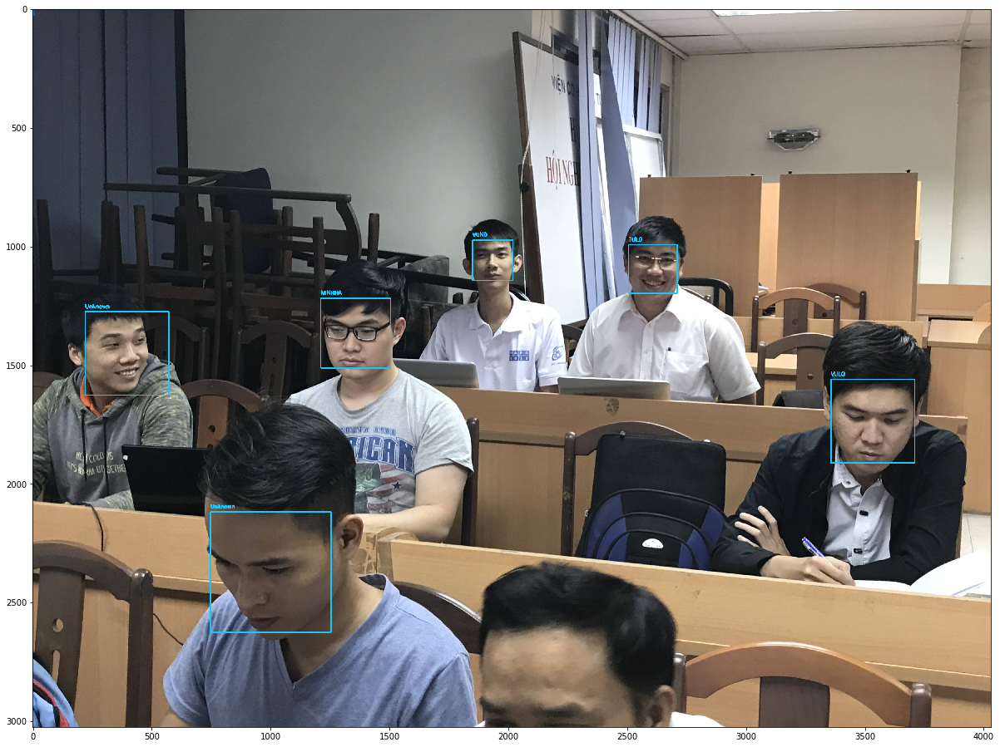

/content/drive/My Drive/TESTDATA_FACE/IMG_5331.jpg


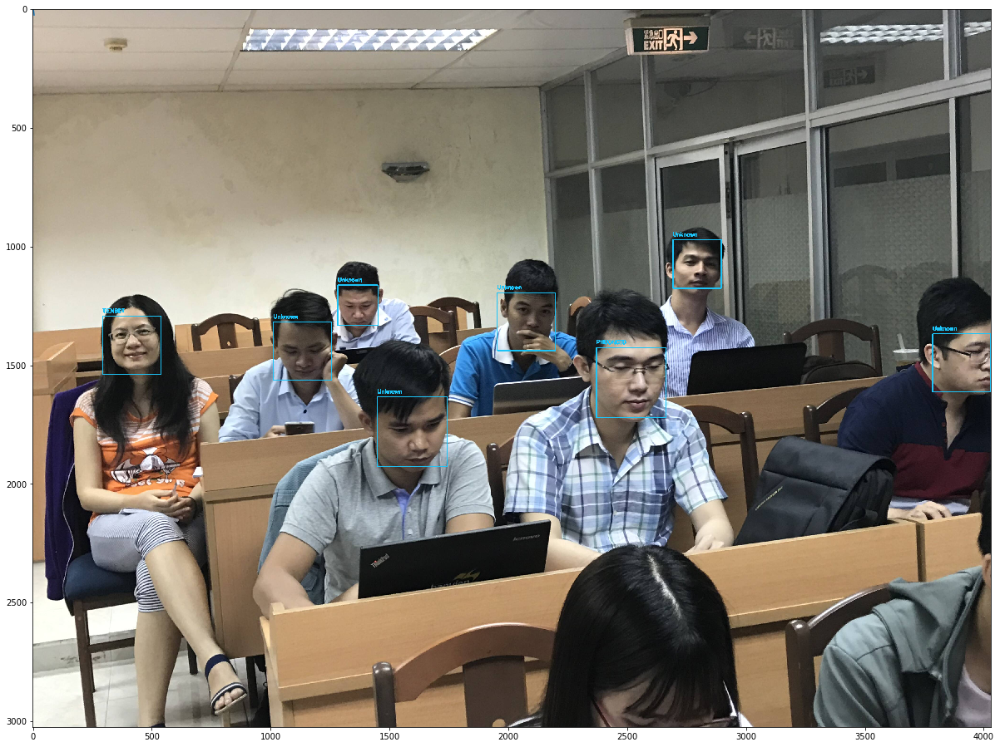

/content/drive/My Drive/TESTDATA_FACE/IMG_5328.jpg


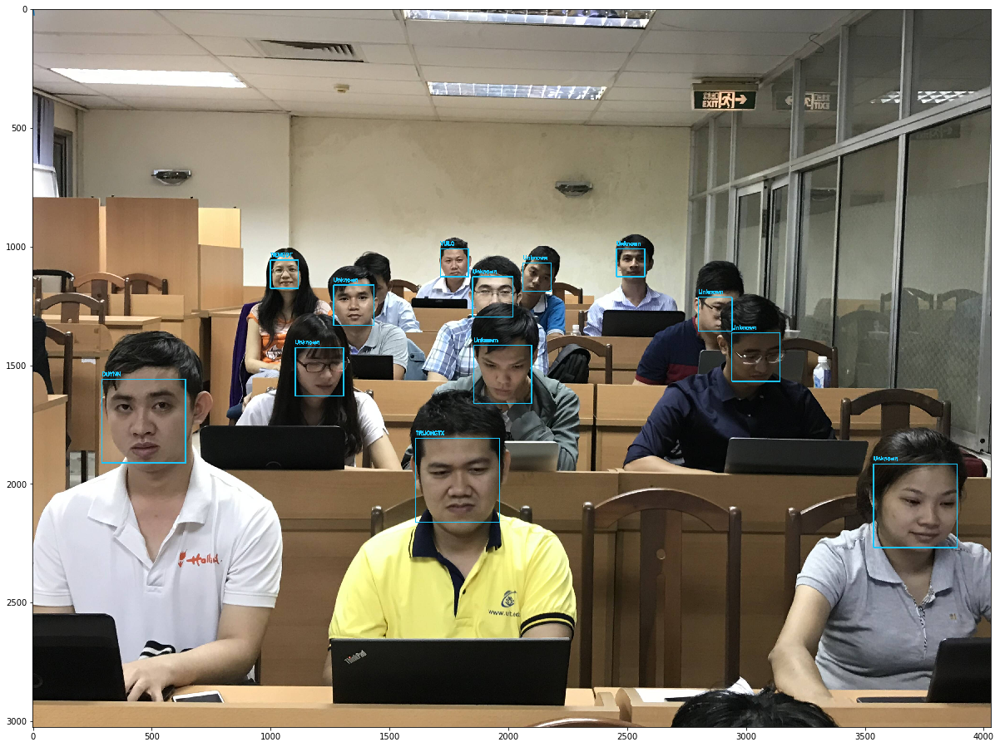

/content/drive/My Drive/TESTDATA_FACE/IMG_5327.jpg


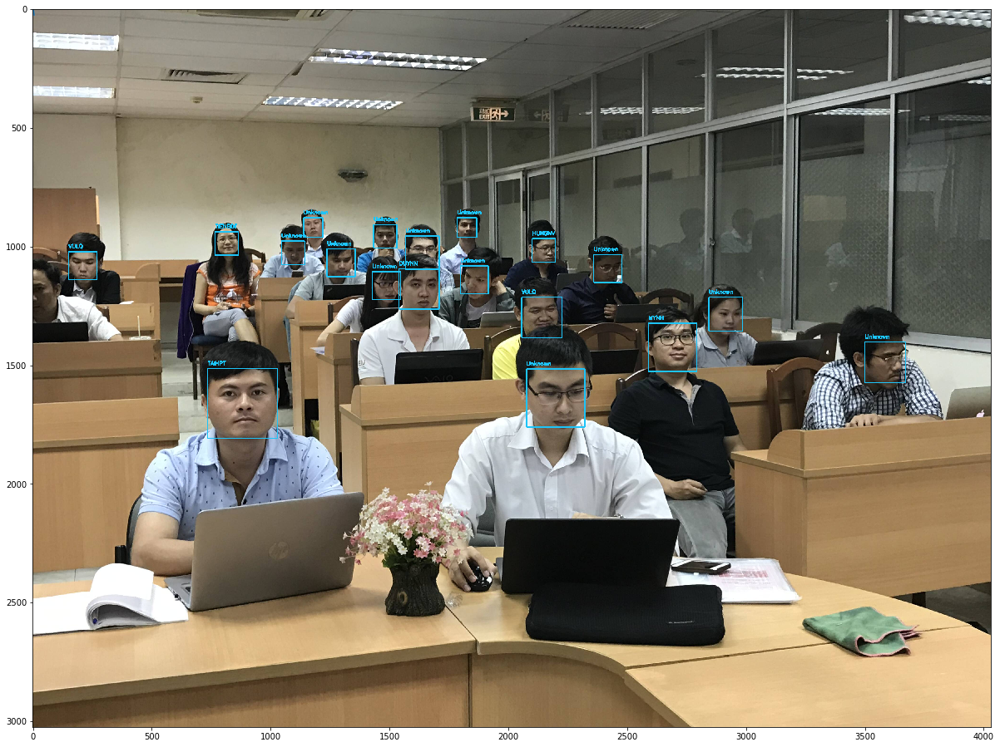

/content/drive/My Drive/TESTDATA_FACE/IMG_5329.jpg


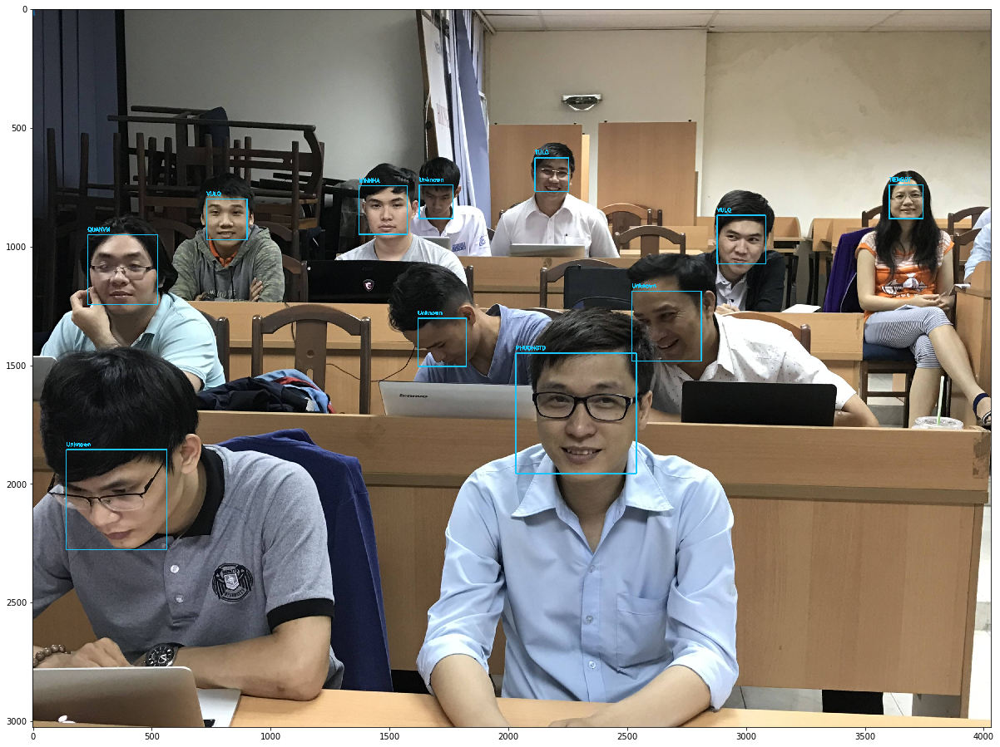

/content/drive/My Drive/TESTDATA_FACE/IMG_5326.jpg


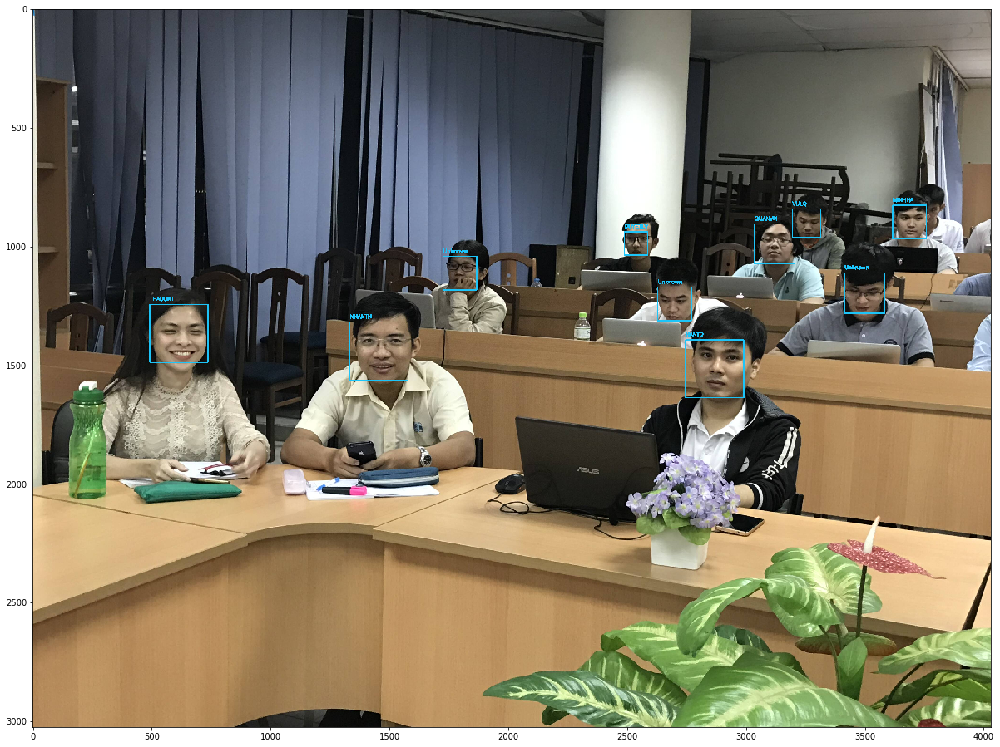

/content/drive/My Drive/TESTDATA_FACE/IMG_5330.jpg


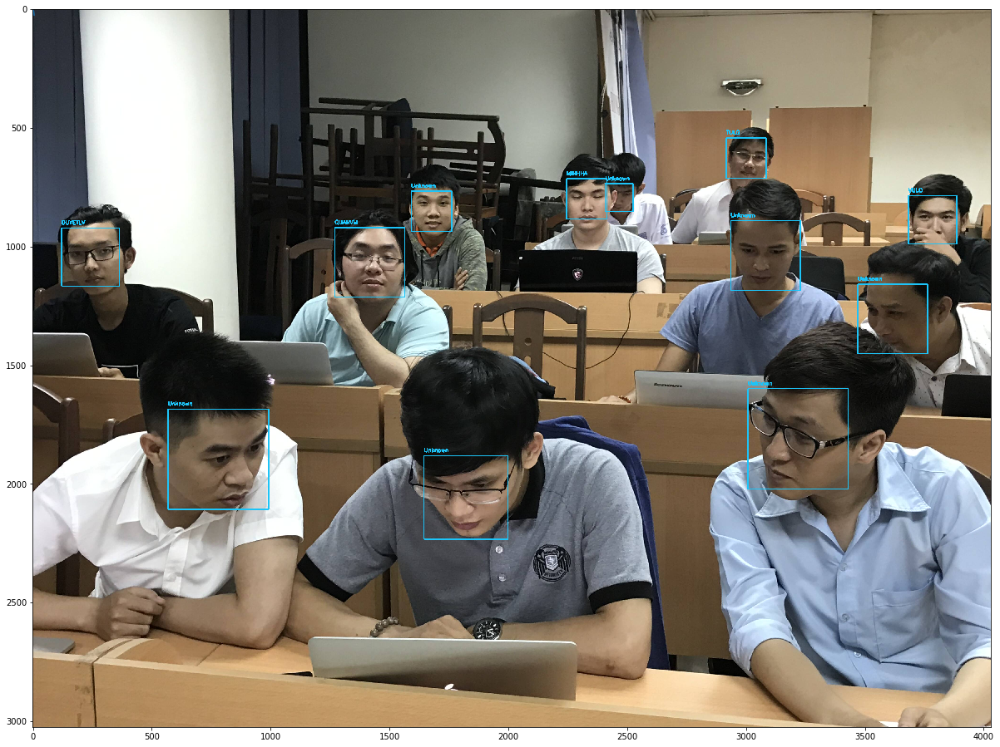

In [0]:

data_test_path="/content/drive/My Drive/TESTDATA_FACE"

for image_path in os.listdir(data_test_path):
  print(os.path.join(data_test_path,image_path))
  image = cv2.imread(os.path.join(data_test_path,image_path))
  rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  # sử dụng model cnn(convolutional neural network)  
  boxes = face_recognition.face_locations(rgb, model="cnn")
  
  # Find all the faces and face encodings in the image
  test_encodings = face_recognition.face_encodings(rgb, boxes)
  
  
  names = []
  #loop từng face trong image input
  for test_encoding in test_encodings:
    #compare face thông quan hàm compare_faces
    #tolerance có giá trị default là 0.6 để kết quả so sánh face chặt chẽ hơn
    #chúng ta cẩn điểu chỉnh thấp hơn.
    # tolerance = 0.4(0.4 là độ đo cho kết quả tốt nhất)
    matches = face_recognition.compare_faces(known_face_encodings,test_encoding, 0.4)
    
    #get name for the face
    name = "Unknown"
    if True in matches:
      matchedIdxs = [i for (i, b) in enumerate(matches) if b]
      counts = {}
      for i in matchedIdxs:
        name = know_face_names[i]
        counts[name] = counts.get(name, 0) + 1
        name = max(counts, key=counts.get)
    names.append(name)
  
  # loop over the recognized faces
  # location face and name on image input
  for ((top, right, bottom, left), name) in zip(boxes, names):
    # draw the predicted face name on the image
    cv2.rectangle(image, (left, top), (right, bottom),(248, 196, 29), 4)
    y = top - 15 if top - 15 > 15 else top + 15
    cv2.putText(image, name, (left, y), cv2.FONT_HERSHEY_SIMPLEX, 0.75,(248, 196, 29), 4)

  # show the output image
  img_cvt = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  fig= plt.figure(figsize=(22,15))
  axes= fig.add_axes([0.1,0.1,0.8,0.8])
  x= [1,2,3,4,5]
  y=[x**2 for x in x]
  axes.plot(x,y)
  plt.imshow(img_cvt)
  plt.show()



#Kết luận


*   Việc detect face khá chính xác hầu như tất cả các face trong bức tranh trừ những face chỉ  xuất hiện dưới 1/3  trong bức tranh.
*   Việc nhận diện đúng chưa cao vì data train con ít cần bổ sun thêm để tăng độ chính xác cao hơn.


*   Tốc độ xữ lý train model chậm vì lượng data train rất ít so với thực tế.



